In [1]:
# Required python imports for querrying the data from the postgresql db, creating wordclouds 

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

from sqlalchemy import create_engine
from sqlalchemy import MetaData, Table

from nltk.corpus import stopwords
from textblob import Word
from wordcloud import WordCloud 
from collections import Counter

In [2]:
# Create connection to the database and python, and print the name of the tables in the database

engine = create_engine("postgresql+psycopg2://<user>:<password>@/<dbname>?host=<host>&port=<port>")

print(f"The tables in the database are: {engine.table_names()}")

The tables in the database are: ['messages', 'user_analysis', 'users', 'channels']


In [4]:
# Refelct all tables in database 
# This block facilitates getting the data from the tables in the db by creating a metadata object for each table identified in the above step
# The connection to the db is then made using the engine object, and SQL query is executed to reflect all the data from each table
# The reflected data is then populated into pandas dataframes using the fetchall method 
# The column names of the dataframe are assigned using the keys method, that gets the names of the columns fomr the database
# Finally remember to close the engine connection (THIS IS AN IMPORTANT PROCESS!) 

metadata      = MetaData()

messages      = Table('messages',      metadata, autoload=True, autoload_with=engine)
user_analysis = Table('user_analysis', metadata, autoload=True, autoload_with=engine)
users         = Table('users',         metadata, autoload=True, autoload_with=engine)
channels      = Table('channels',      metadata, autoload=True, autoload_with=engine)

con = engine.connect()

m   = con.execute('SELECT * FROM messages')
ua  = con.execute('SELECT * FROM user_analysis')
u   = con.execute('SELECT * FROM users')
c   = con.execute('SELECT * FROM channels')

messages        = pd.DataFrame(m.fetchall())
user_analysis   = pd.DataFrame(ua.fetchall())
users           = pd.DataFrame(u.fetchall())
channels        = pd.DataFrame(c.fetchall())

messages.columns        = m.keys()
user_analysis.columns   = ua.keys()
users.columns           = u.keys()
channels.columns        = c.keys()

con.close()

As seen above, the following steps are essential -
    1. Each time we need to get some data out of the database, a connection has to be made with the db
    2. SQL query has to be executed to get the data as required
    3. Data has to be loaded into a pandas dataframe
    4. Column names of the pandas dataframe have to be declared
    5. Finall, the connection to the database has to be closed!  

Out of these steps, except the 2nd step where the SQL query changes from time to time dependent on the data needs, every other step is <font color='red'><b><u>duplicated</u></b></font>.

Let's write a function that eases the work, where we only need to pass a SQL statement as an argument, and the funtion takes care of the rest! 

In [3]:
# Function to take a SQL statement as input and output a pandas dataframe with the query result

def query_manager(stmt):

    '''Usage: query_manager(sql query as string)
       connect object must be defined.
       Return a pandas dataframe object.'''

    con = engine.connect()
    rs  = con.execute(stmt)
    df  = pd.DataFrame(rs.fetchall())
    df.columns = rs.keys()
    con.close()
       
    return df

## Analysis with SQL

Let's query the db to find top 10 users those are part of atleast 10 channels, and have the highest number of channels to number of messages ratio, using only the power of SQL! 

In [4]:
# SQL - Analysis to see top 5 users with no. of channels to no. of messages ratio

stmt_ratio = ('SELECT DISTINCT user_name '
              ', no_messages '
              ', no_channel '
              ', no_messages/no_channel AS ratio '
              'FROM user_analysis '
              'WHERE no_channel >= 10 '
              'ORDER BY ratio DESC '
              'LIMIT 10')

In [5]:
df_ratio_sql = query_manager(stmt_ratio)

df_ratio_sql

,user_name,no_messages,no_channel,ratio
0,Perry Stephenson,2421,31,78
1,Priya Ananthram,728,10,72
2,Justin Mah,594,11,54
3,Jason Nguyen,689,15,45
4,Alex Scriven,2056,47,43
5,Pedro Fernandez,1103,28,39
6,Dan Booth,1127,31,36
7,Kelly Tall,575,18,31
8,tracykeys,738,27,27
9,Len Tay,373,14,26


<b>Perry</b> wins the contest, with an average of 78 messages per channel!

This table also offers us a few other insights apart from the intended target.   
Alex seems to be the widest contributor here, being part of 47 channels, and with 43 messages per channel.  
Dan is member of the same number of channels as Perry, however, with only half the ratio as Perry.

It would be interesting to perform a similar analysis by the channels, rather than the contributors.

## Analysis with Python

In [6]:
# SQL Query to query data from users, messages, channels tables and load into a pandas dataframe for further analysis

stmt = ('SELECT m.channel_id '
        ', m.user_id '
        ', m.message_text '
        ', m.message_reply_count '
        ', u.user_name '
        ', u.user_is_admin '
        ', c.channel_name '
        'FROM messages              AS m '
        'INNER JOIN users           AS u '
        'USING(user_id) '
        'INNER JOIN channels        AS c '
        'ON m.channel_id = c.channel_id '
        'WHERE c.channel_is_archived = FALSE')

In [7]:
## Pass the SQL query 'stmt' into the query_manager funtion to create the dataframe df_master

df_master = query_manager(stmt)

In [8]:
df_master.nunique()

channel_id                66
user_id                  205
message_text           20842
message_reply_count       34
user_name                202
user_is_admin              2
channel_name              66
dtype: int64

Querying the database only for channels that were active, we can see that there are 66 active channels with 202 users contributing to the conversations. 
THe total number of messages in the channels is 20842. Let's do some text analysis on these messages in the upcoming blocks. 

In [9]:
# Print the first 5 lines of the dataframe

df_master.head()

,channel_id,user_id,message_text,message_reply_count,user_name,user_is_admin,channel_name
0,C1924SRPG,U1ALDV1NX,reactive variables are f hard to debug.,0.0,Pedro Fernandez,False,dev_r
1,C18SWDACD,U18TT99MY,Just to re-iterate that point... Please feel f...,0.0,Perry Stephenson,True,mdsi_announcements
2,CC7TMS9JT,U9HTW5Z35,I don't see a face to face class in my timetab...,0.0,Alex Brooks,False,mdsi_stds_proj
3,C192JHDND,U18SN8UQ6,Currently it's just a mash up of old courses r...,0.0,Dan Booth,True,ds_hackathons
4,C18SWDACD,U18TT99MY,"Even better, comments from lecturers can be pi...",0.0,Perry Stephenson,True,mdsi_announcements


In [10]:
# Pre-processing of text data to conduct further analysis

# Convert all text to lower-case
df_master['message_text_mod'] = df_master['message_text'].apply(lambda x: " ".join(x.lower() for x in x.split()))

# Remove punctuations
df_master['message_text_mod'] = df_master['message_text_mod'].str.replace('[^\w\s]','')

# Lemmatize
df_master['message_text_mod'] = df_master['message_text_mod'].apply(lambda x: " ".join([Word(word).lemmatize() for word in x.split()]))

# Stop words rwmoval, with additional stop-words declared based on analysis
stop = stopwords.words('english')
my_stop = ['wa', 'ha', 'im', 'r', 'also', '1', '2', '0', '3', 'u']
stop = stop + my_stop
df_master['message_text_mod'] = df_master['message_text_mod'].apply(lambda x: " ".join(x for x in x.split() if x not in stop))

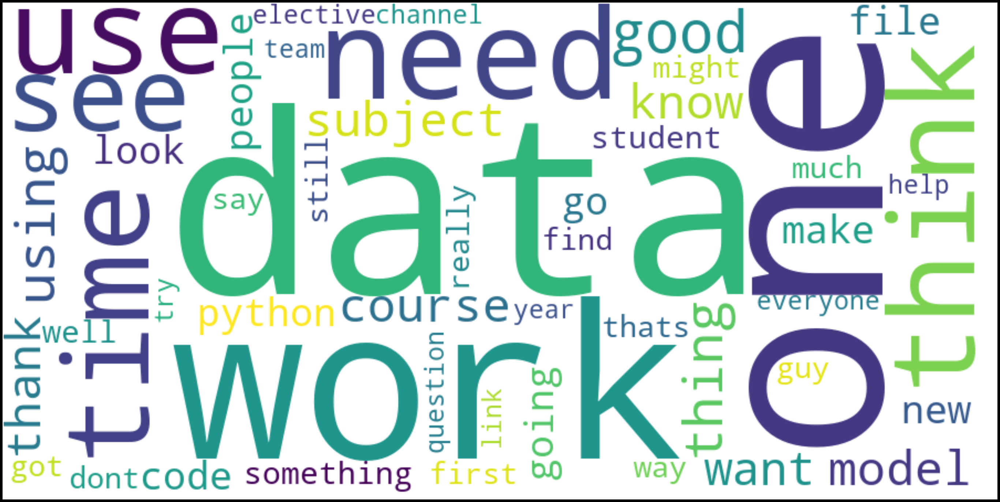

In [11]:
# Unigram wordcloud - word cloud by considering the individual words

message_list        = df_master["message_text_mod"].tolist()
message_str         = ''.join(message_list)
message_list_split  = message_str.split()

width=900
height=450
max_words = 50

counter_obj = Counter(message_list_split)
df_count = pd.DataFrame.from_dict(counter_obj, orient='index').reset_index().sort_values(0, ascending=False)

processed_cloud = WordCloud(width=width, height=height, max_words=max_words,
                              background_color='white').generate(message_str)
plt.figure(figsize=(50,25))
plt.axis("off")
plt.imshow(processed_cloud, interpolation='bilinear') 
plt.show()

'Good', 'subject', 'need', 'data' are some of top words and it's a nice collection of words (GOOD SUBJECT NEED DATA) for a Data Science Slack channel! No real surprises here! 

Let's see how the words look when we group two words together! 


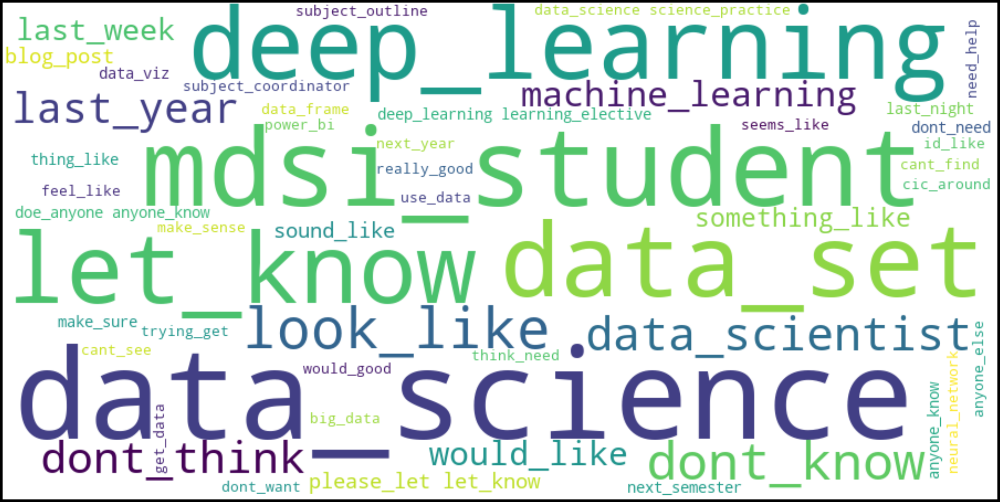

In [12]:
#  Bi-gram wordcloud

i = 0
bi_gram = []
for message_list_split[i] in message_list_split:
    if i <= len(message_list_split)-2:
        k = message_list_split[i] + str('_') + message_list_split[i+1] + str(' ')
        bi_gram.append(k)
        i += 1

message_str_2gram = ''.join(bi_gram)
message_list_split_2gram = message_str_2gram.split()

counter_obj = Counter(message_list_split_2gram)
df_2gram = pd.DataFrame.from_dict(counter_obj, orient='index').reset_index().sort_values(0, ascending=False)

processed_cloud = WordCloud(width=width, height=height, max_words=max_words, background_color='white').generate(message_str_2gram)

plt.figure(figsize=(50,25))
plt.axis("off")
plt.imshow(processed_cloud, interpolation='bilinear') 
plt.show()

While top picks are 'deep learning', 'machine learning' and 'data set', notice that there 'data science' and 'science practise' peeking in there along with 'would like' ;) 

Let's take it one more step ahead and group three words together! 

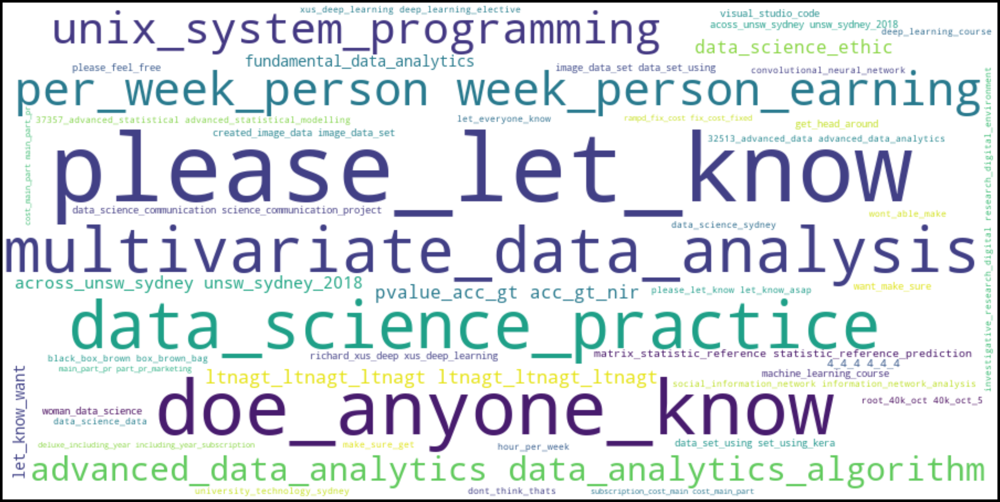

In [14]:
# ngram = 3

i = 0
tri_gram = []
for message_list_split[i] in message_list_split:
    if i <= len(message_list_split)-3:
        k = message_list_split[i] + str('_') + message_list_split[i+1] + str('_') + message_list_split[i+2] + str(' ')
        tri_gram.append(k)
        i += 1

message_str_3gram = ''.join(tri_gram)
message_list_split_3gram = message_str_3gram.split()
processed_cloud = WordCloud(width=width, height=height, max_words=max_words,
                              background_color='white').generate(message_str_3gram)
plt.figure(figsize=(50,25))
plt.axis("off")
plt.imshow(processed_cloud, interpolation='bilinear') 
plt.show()

BOOM! There we have it! Data Science Practise has been the talk of the town since then! Yet another indiciation of how invaluable this subject is going to be! ;)  
We can also see that there are a number of other offered subjects that appear here - advance statistical modelling, social information network, unix system programming, information network analysis.  
UTS itsels makes an appearance! 

With the wordcloud already offering some interesting insights on what the students have been talking about or interested in, let's perform another test on the text dataset collection. 

SETI - Search for Extra-terrestrial Intelligence, a part of the European Space Agency, looks for the following pattern in a signal to verify if the signal is originally generated by an intelligent life-form. A signal with information is bound to have majority of its content conveyed by only a significantly small set of words. 

With the stop-words already removed, let's plot an Empirical Cumulative Distributive Function of the number of words in the corpus and to what percentage of the corpus they contribute to. (While this may not be the right tool for this analysis, ECDF plots are a great tool to understand the distribution of most datasets. The defined function can be taken as a separate module and used easily!)

In [15]:
# Empricial Cumulative Distributive Function 
# To understand the distribution of individual words used (Stop words have been removed!)

def ecdf(data):

    '''Compute ECDF for a one-dimensional array of measurements.
       Usage: ecdf(numpy array)
       Returns two numpy arrays: x - variable, y - probability of occurance.'''
    # Number of data points: n
    n = len(data)

    # x-data for the ECDF: x
    x = np.sort(data)
    # y-data for the ECDF: y
    y = np.arange(1, n+1) / n
    
    return x, y

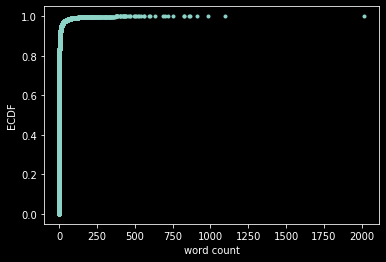

In [16]:
df_count_data = np.array(df_count[0])
x_data, y_data = ecdf(df_count_data)

_ = plt.plot(x_data, y_data, marker='.', linestyle='none')
_ = plt.xlabel('word count')
_ = plt.ylabel('ECDF')

plt.show()

Less that 50 words in the whole corpus are used to represent over 90% of the data in the whole corpus - a sign that the students of MDSI are out-of-the-world intelligent? ;)

### Conclusion of analysis with python : 
1. 3 words wordcloud revealed some interesting insight into the top topic discussed by students
2. Distribution of words in the whole dataset was observed

In [17]:
# Drop the unused variables

del df_count, df_count_data, bi_gram, Counter, counter_obj, df_2gram, message_list, message_list_split, message_list_split_2gram, message_list_split_3gram, message_str, message_str_2gram, message_str_3gram, tri_gram, x_data, y_data

## Analysis with R

Next let's analyze the data using R.

R is one of the most powerful and recognized data analysis tools. It can be called from within python with the help of rpy2 package.  
https://rpy2.readthedocs.io/en/version_2.8.x/porting-to-rpy2.html

Let's get the environment setup, get some packages from R and start exploring the data.

In [19]:
# Calling the R requisites into python using rpy2 and loading the pandas dataframe object created at the 'Analysis with SQL' section to visualize the insights 

from rpy2.robjects import pandas2ri
pandas2ri.activate()

import rpy2.robjects as robjects
from rpy2.robjects.lib import grdevices
from rpy2.robjects.packages import importr
from rpy2.robjects.conversion import localconverter
from IPython.display import Image, display

base = importr('base')

# Call R function on a pandas dataframe
base.summary(df_ratio_sql)

array(['Length:10         ', 'Class :character  ', 'Mode  :character  ',
       'NA', 'NA', 'NA', 'Min.   : 373.0  ', '1st Qu.: 617.8  ',
       'Median : 733.0  ', 'Mean   :1040.4  ', '3rd Qu.:1121.0  ',
       'Max.   :2421.0  ', 'Min.   :10.00  ', '1st Qu.:14.25  ',
       'Median :22.50  ', 'Mean   :23.20  ', '3rd Qu.:30.25  ',
       'Max.   :47.00  ', 'Min.   :26.00  ', '1st Qu.:32.25  ',
       'Median :41.00  ', 'Mean   :45.10  ', '3rd Qu.:51.75  ',
       'Max.   :78.00  '], dtype='<U18')

In [20]:
with localconverter(robjects.default_converter + pandas2ri.converter):
  r_df_master = robjects.conversion.py2rpy(df_ratio_sql)

r_df_master

user_name,no_messages,no_channel,ratio
...,...,...,...


/Users/loki/.virtualenvs/dl4cv/lib/python3.6/site-packages/rpy2/robjects/lib/ggplot2.py:71: UserWarning: This was designed againt ggplot2 version 3.2.1 but you have 3.0.0
  'have %s' % (TARGET_VERSION, ggplot2.__version__))


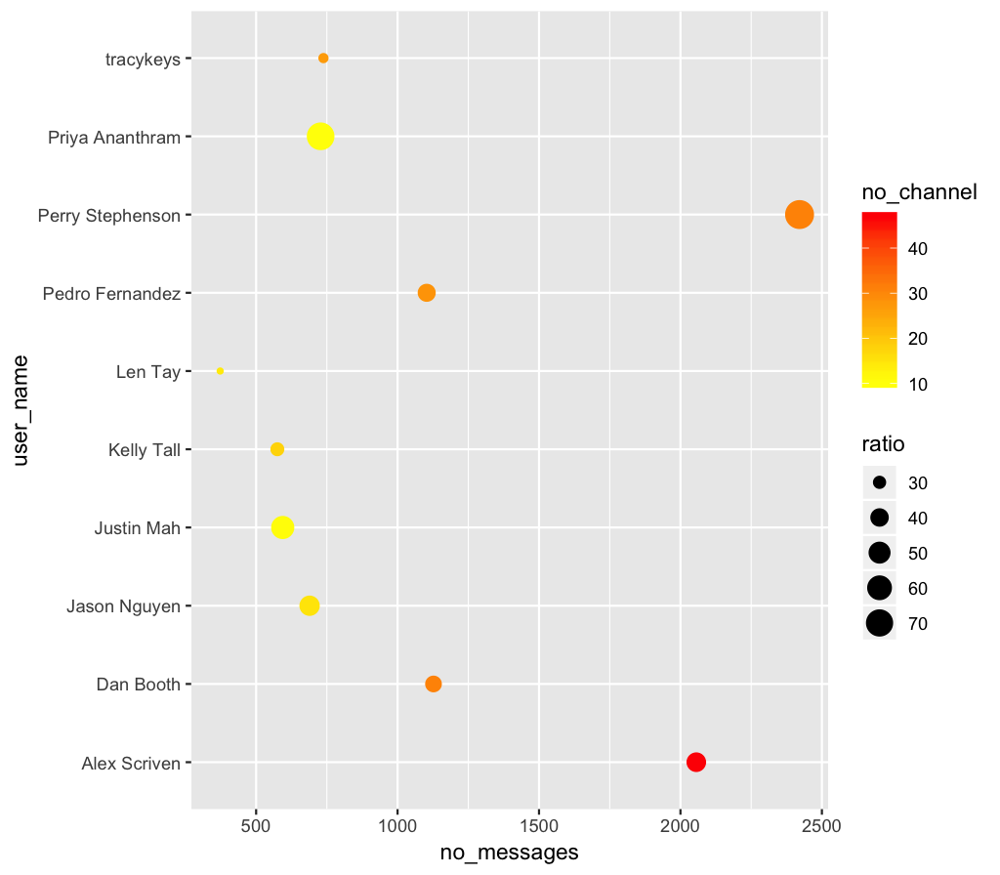

In [21]:
# Visualize the insights using the most popular R visualization package ggplot2 

import rpy2.robjects.lib.ggplot2 as ggplot2

with grdevices.render_to_bytesio(grdevices.png, width=1024, height=896, res=150) as img:
    gp = ggplot2.ggplot(r_df_master)
    pp = (gp
          + ggplot2.aes_string(x='user_name', y='no_messages', color='no_channel', size='ratio')
          + ggplot2.geom_point()
          + ggplot2.scale_colour_gradient(low='yellow', high='red')
          + ggplot2.coord_flip()            
         )   
    pp.plot()
    
display(Image(data=img.getvalue(), format='png', embed=True))

Originally, in the above plot, the user names were plot in the x-axis and the total number of messages sent by the user were plot in the y-axis.  
Color scale is used to visualize the number of channels each top contributing user is part of.   
Finally, the ratio of number of messages a user has sent to the number of channels they contribute to is represented by the size of the points.  
However, the user names in the plot drawn as such collide against one other contributing to clutter in the graph. To avoid this, the plot has been flipped on its coordinates to produce a nice and easy-to-interpret graph. 

<b>Interpreting the graph</b> for one-user -  
Alex has sent a total number of ~2K messages, with an average of ~40 messages per ~50 channels that he is part of! 

The colors of the graph give a sense of the intensity of the number of different conversations that a user participates in while the size gives the average messages they have sent. 
When we see a light color point with a larger circle, we can assume that the user is very active in a small number of topics, while a darker average sized point means the user is quite active in a diverse set of conversations. 

## Conclusion:  
In this notebook we saw how to do the following -  
1. Connect python to a SQL database  
2. Reflect the database metadata such as table names, content, etc.   
3. Define a re-usable python function for reproduceability  
4. Query data from a database and load into a python pandas dataframe  
5. Call to R from within python, load data from a pandas dataframe into a R data frame and call various R packages and utilize their powers within python, using rpy2  
6. Analyse dataset using SQL, Python and R  

### Insights from the analysis
1. Top contributors to the MDSI community discussions
2. Top topics discussed 
3. Power of ggplot visualization to summarize insights from datasets
4. Use of ECDF plot to understand distribution of a dataset - in this case, we saw ~5% of unique words in the dataset contribute to over 90% of the usage in the collection

### Just for fun insights 
1. Perry and Alex have been the most active participants of theslack channel discussion both in number of messages and number of channels ;)  
2. Students of MDSI are out-of-the-world intelligent ;P  
3. Data Science Practise has been topic of discussion and has finally materialized showing the effectives of the slack MDSI community discussions!    
4. 'Good subject needs data' is established based on the discussion of the UTS MDSI community!